<a href="https://colab.research.google.com/github/Haritha-PV/Restaurant-Data-Analysis/blob/main/Restaurant_Data_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **INTERNSHIP**

# **Project Name**- Restaurant Data Analysis

The project contains the dataset of restaurants all over the world with its details. Using the data provided several insights are been created on each restaurant.There are several tasks given,by using the dataset we have to get the results.

## Loading the Data

In [ ]:
#Loading the necessary libraries
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import folium

In [ ]:
#Mounting the drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#csv file location
file_path="/content/drive/MyDrive/cognifyz technology data analysis/Copy of Dataset .csv"

In [ ]:
#Importing the dataset
dataset=pd.read_csv(file_path)


In [ ]:
#insights of data
print(dataset.head())

   Restaurant ID         Restaurant Name  Country Code              City  \
0        6317637        Le Petit Souffle           162       Makati City   
1        6304287        Izakaya Kikufuji           162       Makati City   
2        6300002  Heat - Edsa Shangri-La           162  Mandaluyong City   
3        6318506                    Ooma           162  Mandaluyong City   
4        6314302             Sambo Kojin           162  Mandaluyong City   

                                             Address  \
0  Third Floor, Century City Mall, Kalayaan Avenu...   
1  Little Tokyo, 2277 Chino Roces Avenue, Legaspi...   
2  Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...   
3  Third Floor, Mega Fashion Hall, SM Megamall, O...   
4  Third Floor, Mega Atrium, SM Megamall, Ortigas...   

                                     Locality  \
0   Century City Mall, Poblacion, Makati City   
1  Little Tokyo, Legaspi Village, Makati City   
2  Edsa Shangri-La, Ortigas, Mandaluyong City   
3      SM 

# Top three cuisines

In [ ]:
#Top three most common cuisine in Dataset
cuisine_count=dataset['Cuisines'].value_counts()
top_cuisines=cuisine_count.head(3)
print(top_cuisines)

North Indian             936
North Indian, Chinese    511
Chinese                  354
Name: Cuisines, dtype: int64


# Percentage of restaurant serving top three cuisines

In [ ]:
#percentage of restaurants serving top cuisines
total_restaurants=len(dataset)
print(total_restaurants)
percentage=(top_cuisines/total_restaurants)*100
print(percentage)

9551
North Indian             9.800021
North Indian, Chinese    5.350225
Chinese                  3.706418
Name: Cuisines, dtype: float64


# City with highest number of restaurants

In [ ]:
city_count=dataset['City'].value_counts()
print(city_count)

New Delhi           5473
Gurgaon             1118
Noida               1080
Faridabad            251
Ghaziabad             25
                    ... 
Panchkula              1
Mc Millan              1
Mayfield               1
Macedon                1
Vineland Station       1
Name: City, Length: 141, dtype: int64


In [ ]:
#city with most restaurant
max_restaurant_city=city_count.index[0]
print(f"City with highest number of restaurants is {max_restaurant_city}")

City with highest number of restaurants is New Delhi


# Average rating of resturants in each city

In [ ]:
average_rating_in_each_city=dataset.groupby('City')['Aggregate rating'].mean()
print(average_rating_in_each_city)

City
Abu Dhabi          4.300000
Agra               3.965000
Ahmedabad          4.161905
Albany             3.555000
Allahabad          3.395000
                     ...   
Weirton            3.900000
Wellington City    4.250000
Winchester Bay     3.200000
Yorkton            3.300000
��stanbul          4.292857
Name: Aggregate rating, Length: 141, dtype: float64


# City with highest average rating

In [ ]:
highest_avg_rating_city=average_rating_in_each_city.idxmax()
print(f"City with highest average rating is {highest_avg_rating_city}")

City with highest average rating is Inner City


# Distribution of price range among the restaurant

In [ ]:
price_range_counts=dataset['Price range'].value_counts().sort_index()
print(price_range_counts)

1    4444
2    3113
3    1408
4     586
Name: Price range, dtype: int64


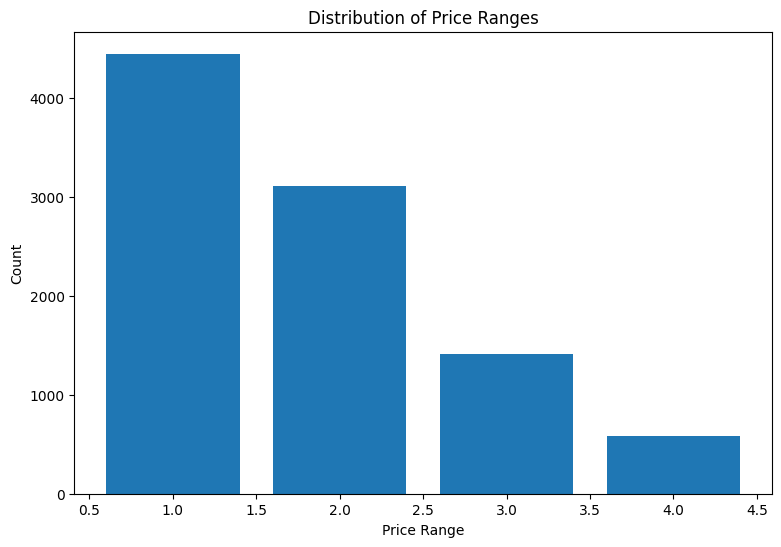

In [ ]:
plt.figure(figsize=(9,6))
plt.bar(price_range_counts.index,price_range_counts.values)
plt.xlabel('Price Range')
plt.ylabel('Count')
plt.title('Distribution of Price Ranges')
plt.show()

# Percentage of restaurant in each price range category

In [ ]:
total_restaurant=len(dataset)
percentage_in_each_price_range=(price_range_counts/total_restaurant)*100
print(f"Percentage of restaurant in each price range category is\n{percentage_in_each_price_range}")

Percentage of restaurant in each price range category is
1    46.529159
2    32.593446
3    14.741912
4     6.135483
Name: Price range, dtype: float64


# Percentage of restaurant offering online delivery

In [ ]:
total_restaurant=len(dataset)
online_delivery_restaurants=dataset['Has Online delivery'].value_counts().get('Yes',0)
print(online_delivery_restaurants)

2451


In [ ]:
percentage_with_online_delivery=(online_delivery_restaurants/total_restaurant)*100
print("Percentage of restaurant offering online delivery is",percentage_with_online_delivery)

Percentage of restaurant offering online delivery is 25.662234321013504


# Average rating of restaurant with and without online delivery

In [ ]:
average_rating_with_online_delivery=dataset[dataset['Has Online delivery']=='Yes']['Aggregate rating'].mean()
average_rating_without_online_delivery=dataset[dataset['Has Online delivery']=='No']['Aggregate rating'].mean()

In [ ]:
print("Average rating of restaurant with online deliver:",average_rating_with_online_delivery)
print("Average rating of restaurant without online deliver:",average_rating_without_online_delivery)

Average rating of restaurant with online deliver: 3.2488372093023257
Average rating of restaurant without online deliver: 2.465295774647887


# Comparing average rating of restaurant with and without online delivery

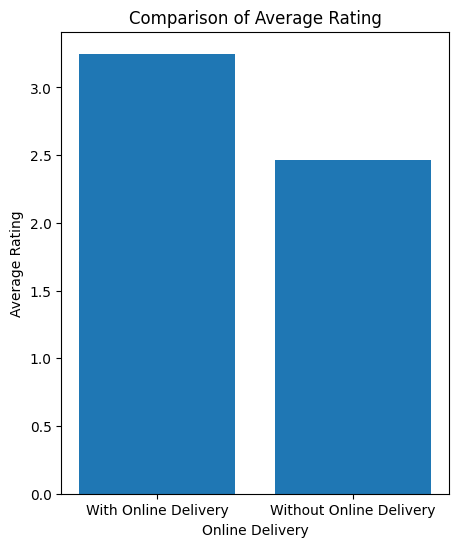

In [ ]:
labels=['With Online Delivery','Without Online Delivery']
average_ratings=[average_rating_with_online_delivery,average_rating_without_online_delivery]
plt.figure(figsize=(5,6))
plt.bar(labels,average_ratings)
plt.xlabel('Online Delivery')
plt.ylabel('Average Rating')
plt.title('Comparison of Average Rating')
plt.show()

# Distribution of aggregate ratings

<function matplotlib.pyplot.show(close=None, block=None)>

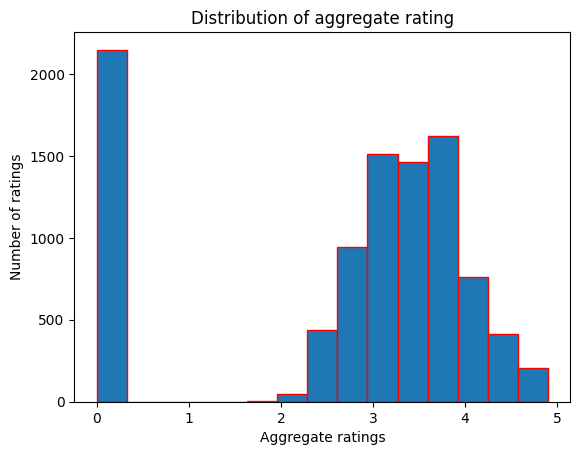

In [ ]:
plt.hist(dataset['Aggregate rating'],bins=15,edgecolor='red')
plt.xlabel('Aggregate ratings')
plt.ylabel('Number of ratings')
plt.title('Distribution of aggregate rating')
plt.show

# Most common aggregate rating range

In [ ]:
aggregate_rating_count=dataset['Aggregate rating'].value_counts().sort_index()

In [ ]:
#most common rating range
most_common_rating_range=aggregate_rating_count.idxmax()
print("Most common rating range is",most_common_rating_range)

Most common rating range is 0.0


# Average number of votes recieved by restaurant

In [ ]:
average_votes=dataset['Votes'].mean()
print("Average number of votes received by restaurant is",average_votes)

Average number of votes received by restaurant is 156.909747670401


# Common combination of cuisines

In [ ]:
cuisine_combination_counts=dataset['Cuisines'].value_counts()
most_common_cuisine_combination=cuisine_combination_counts.head(5)
print("Most common cuisine combinations are\n",most_common_cuisine_combination)

Most common cuisine combinations are
 North Indian             936
North Indian, Chinese    511
Chinese                  354
Fast Food                354
North Indian, Mughlai    334
Name: Cuisines, dtype: int64


# Higher rating cuisine combination

In [ ]:
cuisine_combination_rating=dataset.groupby("Cuisines")["Aggregate rating"].mean()

In [ ]:
top_5_rating=cuisine_combination_rating.nlargest(5)
print(top_5_rating)

Cuisines
American, BBQ, Sandwich         4.9
American, Burger, Grill         4.9
American, Caribbean, Seafood    4.9
American, Coffee and Tea        4.9
American, Sandwich, Tea         4.9
Name: Aggregate rating, dtype: float64


# Location of restaurant on a map

In [ ]:
restaurant_names=dataset["Restaurant Name"]
latitude=dataset["Latitude"]
longitude=dataset["Longitude"]

In [ ]:
x=dataset[["Latitude","Longitude"]]
num_clusters=5
kmeans=KMeans(n_clusters=num_clusters,random_state=42)
dataset["Cluster"]=kmeans.fit_predict(x)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [ ]:
map_center=[latitude.mean(),longitude.mean()]
restaurant_map=folium.Map(location=map_center,zoom_start=12)

In [ ]:
for index, row in dataset.iterrows():
  restaurant_name=row["Restaurant Name"]
  latitude=row["Latitude"]
  longitude=row["Longitude"]
  cuisines=row["Cuisines"]
  rating=row["Aggregate rating"]
  cluster=row["Cluster"]

  popup_text=f"Restaurant:{restaurant_name}\nCuisines:{cuisines}\nRating:{rating}"
  marker=folium.Marker([latitude,longitude],popup=popup_text)
  marker.add_to(restaurant_map)

In [ ]:
display(restaurant_map)

# Restaurant chains

In [ ]:
restaurant_chains=dataset.groupby("Restaurant Name").size().reset_index(name="Chain count")
print(restaurant_chains)

           Restaurant Name  Chain count
0                      #45            1
1             #Dilliwaala6            1
2             #InstaFreeze            1
3              #OFF Campus            1
4             #Urban Caf��            1
...                    ...          ...
7441    t Lounge by Dilmah            1
7442                tashas            1
7443              wagamama            1
7444  {Niche} - Cafe & Bar            1
7445     �ukura��a Sofras۱            1

[7446 rows x 2 columns]


In [ ]:
chains=restaurant_chains['Chain count']>1

In [ ]:
chains=restaurant_chains.sort_values(by='Chain count',ascending=False)

In [ ]:
restaurant_chain_top10=chains.head(10)
print("Restaurant chains in top 10 are:\n",restaurant_chain_top10)

Restaurant chains in top 10 are:
        Restaurant Name  Chain count
1098   Cafe Coffee Day           83
2098    Domino's Pizza           79
6106            Subway           63
2716  Green Chick Chop           51
4077        McDonald's           48
3478         Keventers           34
4961         Pizza Hut           30
2619             Giani           29
680     Baskin Robbins           28
663    Barbeque Nation           26
